--- 開始評估 P4 姿勢 ---
--- 將顯示被誤判為 p1, p2, p3 的樣本 ---


Processing p5:  31%|███       | 24/78 [00:31<01:04,  1.19s/it]

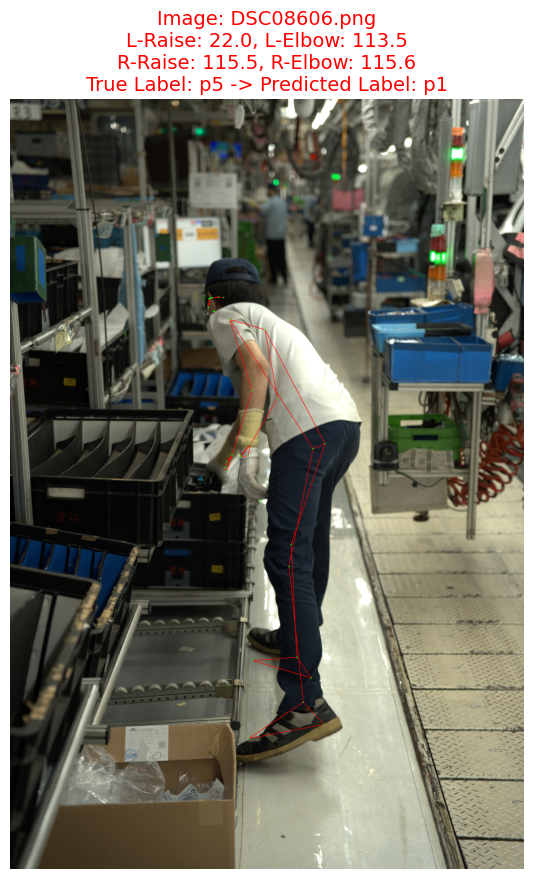

Processing p5:  65%|██████▌   | 51/78 [01:07<00:32,  1.22s/it]

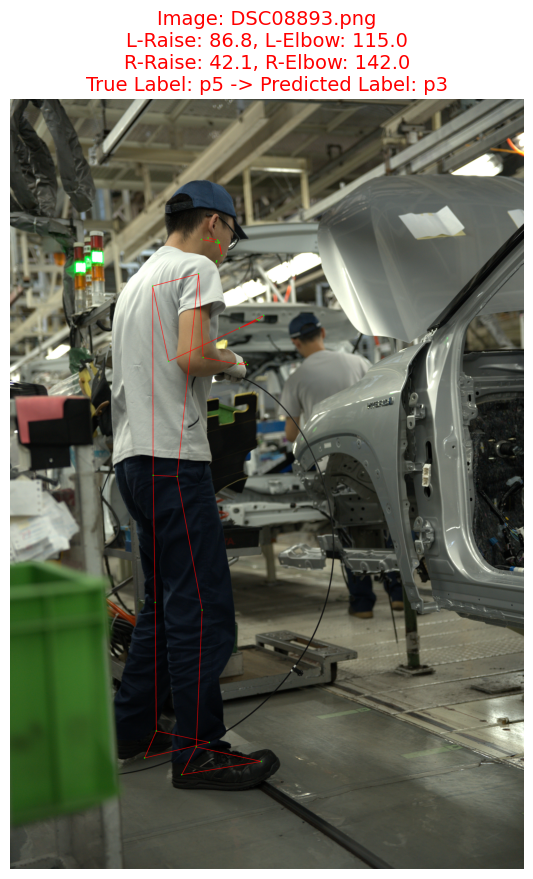

Processing p5:  67%|██████▋   | 52/78 [01:10<00:49,  1.89s/it]

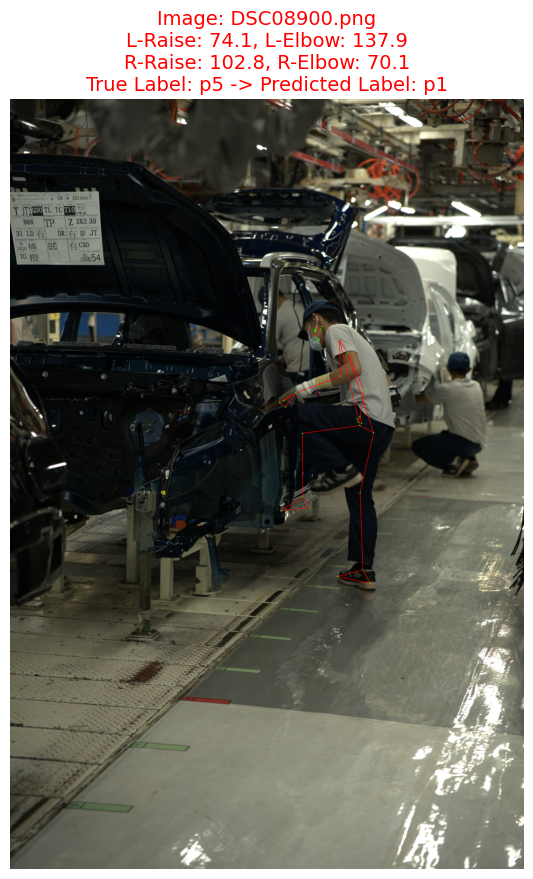

Processing p5:  68%|██████▊   | 53/78 [01:14<00:58,  2.33s/it]

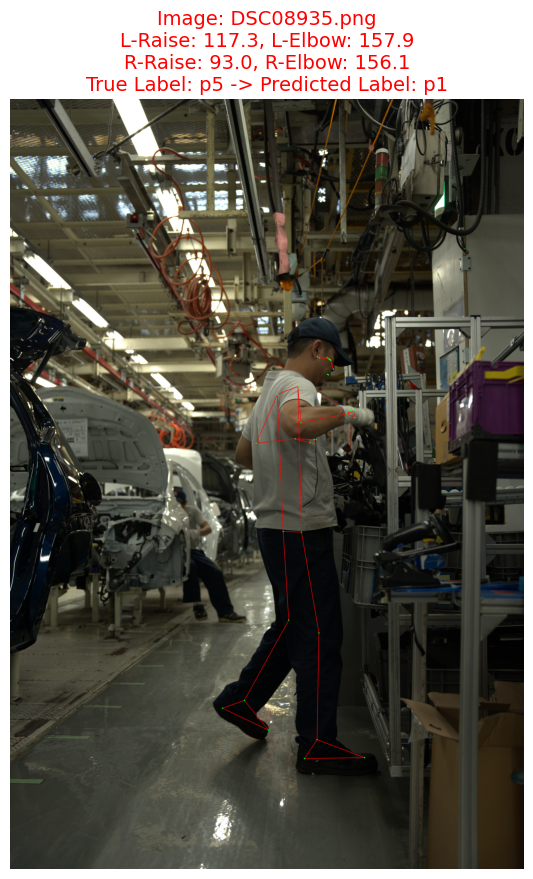

Processing p5:  69%|██████▉   | 54/78 [01:17<01:05,  2.72s/it]

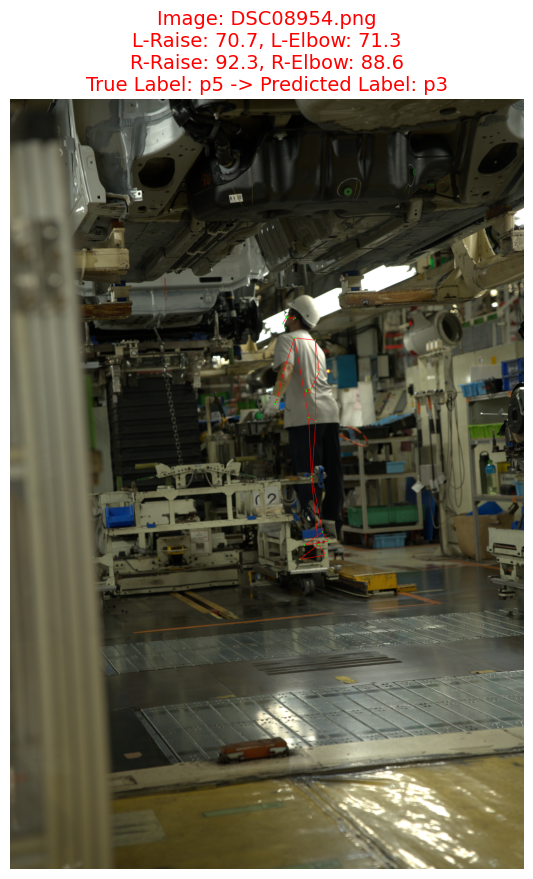

Processing p5:  71%|███████   | 55/78 [01:21<01:10,  3.07s/it]

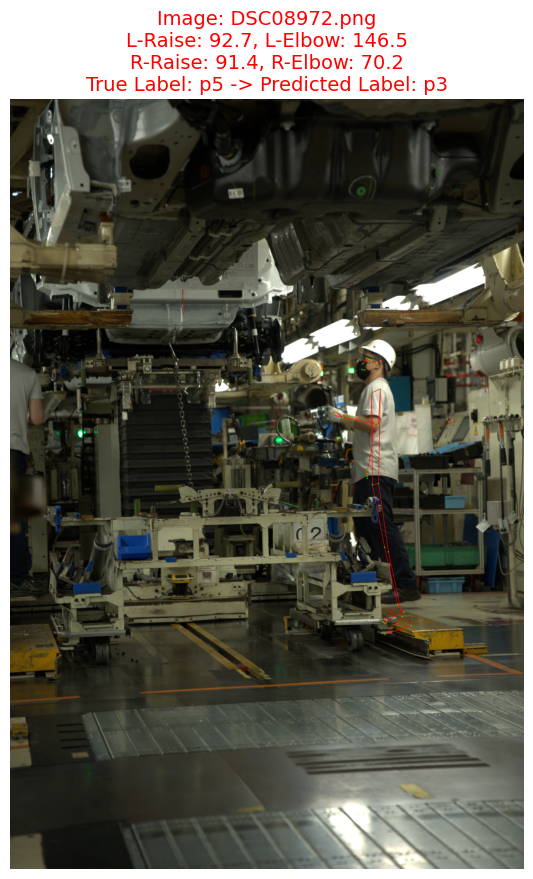

Processing p5:  72%|███████▏  | 56/78 [01:26<01:17,  3.52s/it]

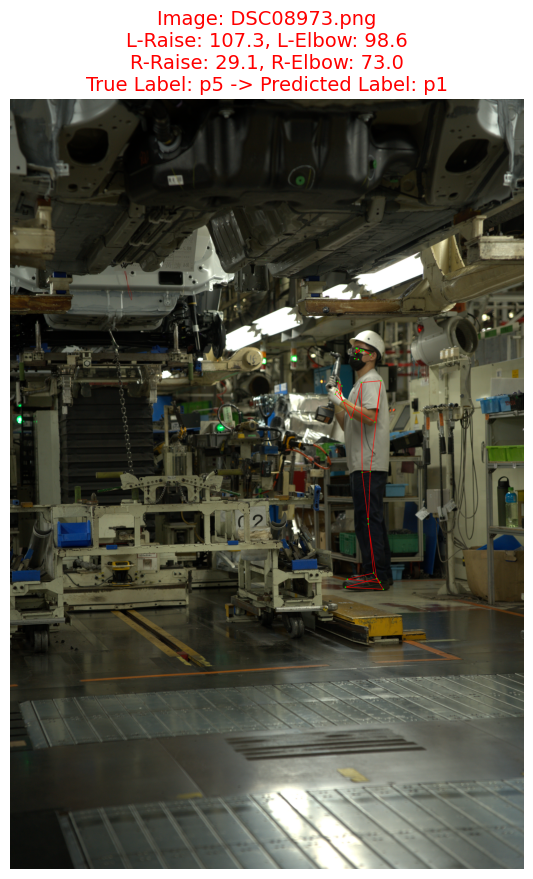

Processing p5:  73%|███████▎  | 57/78 [01:30<01:21,  3.87s/it]

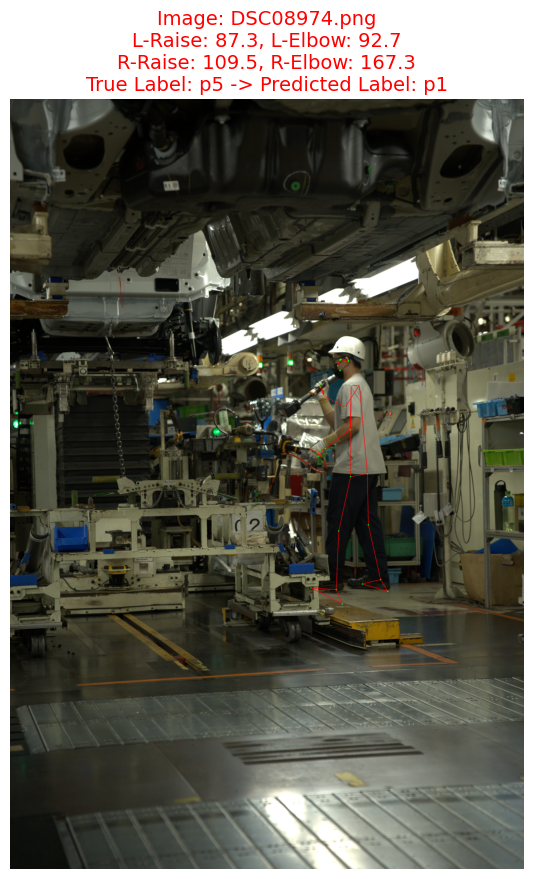

Processing p5:  74%|███████▍  | 58/78 [01:35<01:19,  4.00s/it]

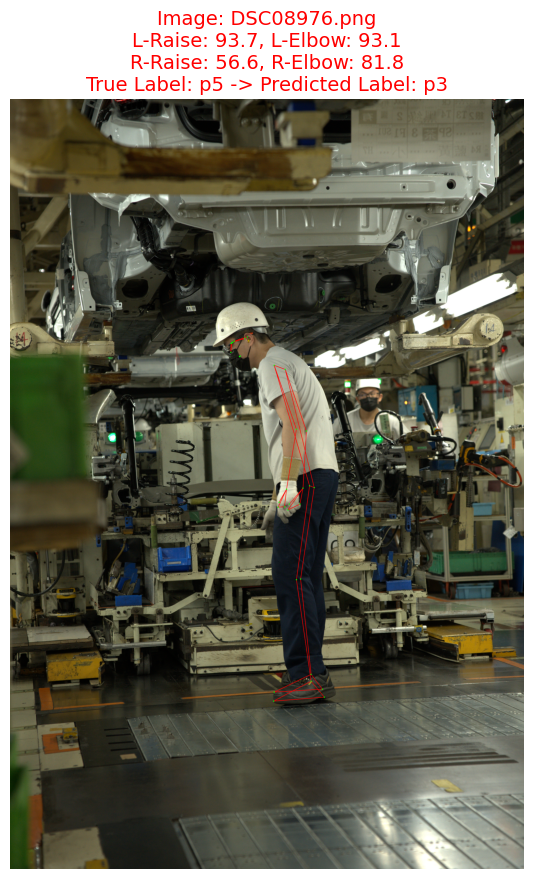

Processing p5:  76%|███████▌  | 59/78 [01:39<01:17,  4.10s/it]

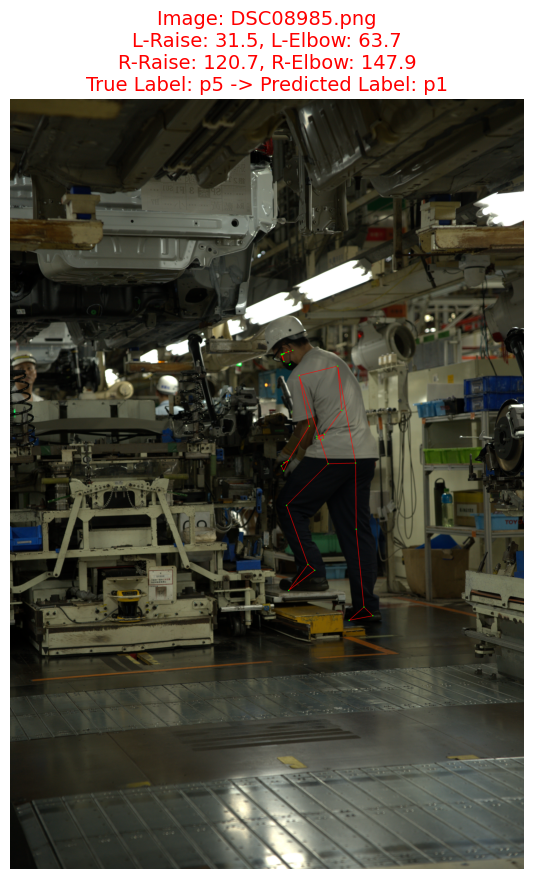

Processing p5:  79%|███████▉  | 62/78 [01:46<00:45,  2.85s/it]

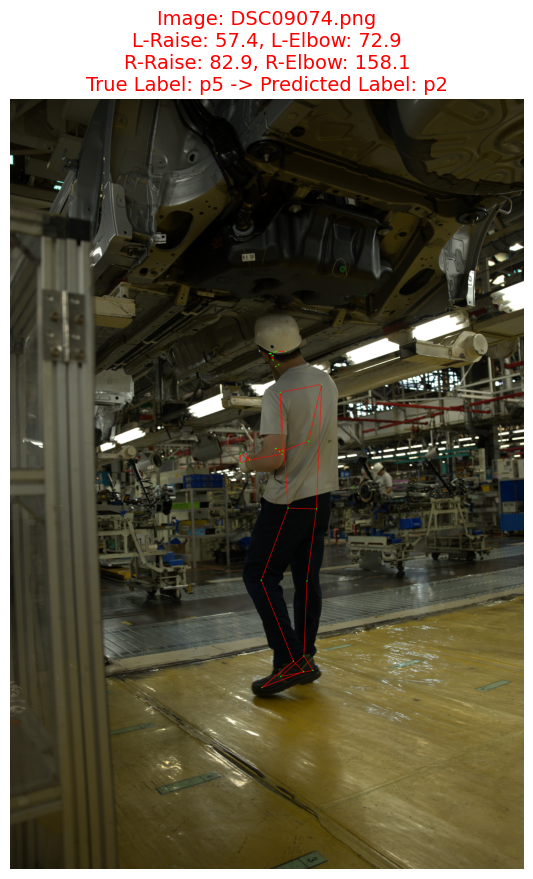

Processing p5:  81%|████████  | 63/78 [01:51<00:49,  3.30s/it]

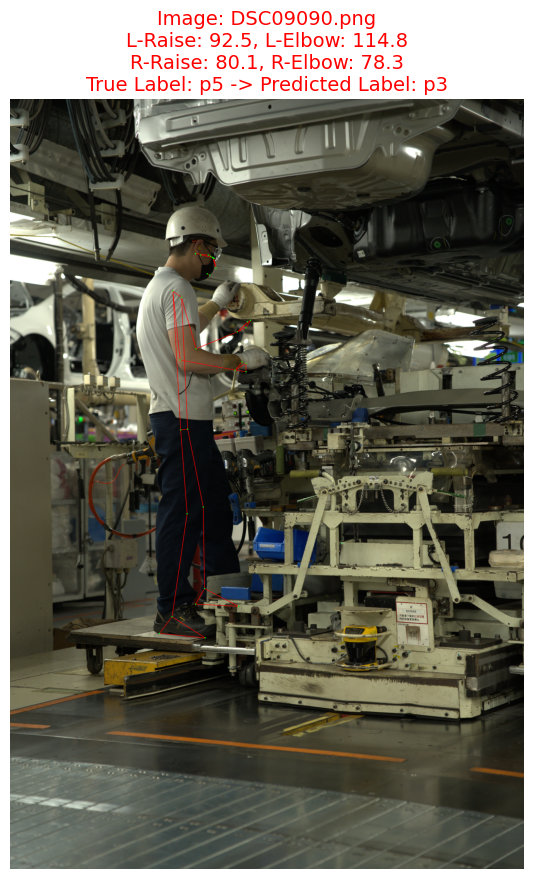

Processing p5:  82%|████████▏ | 64/78 [01:55<00:50,  3.60s/it]

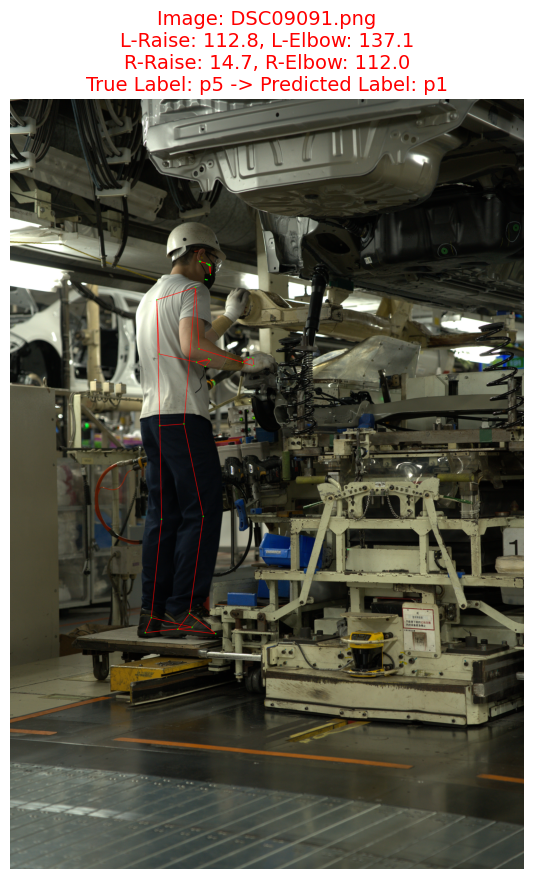

Processing p5:  88%|████████▊ | 69/78 [02:06<00:19,  2.12s/it]

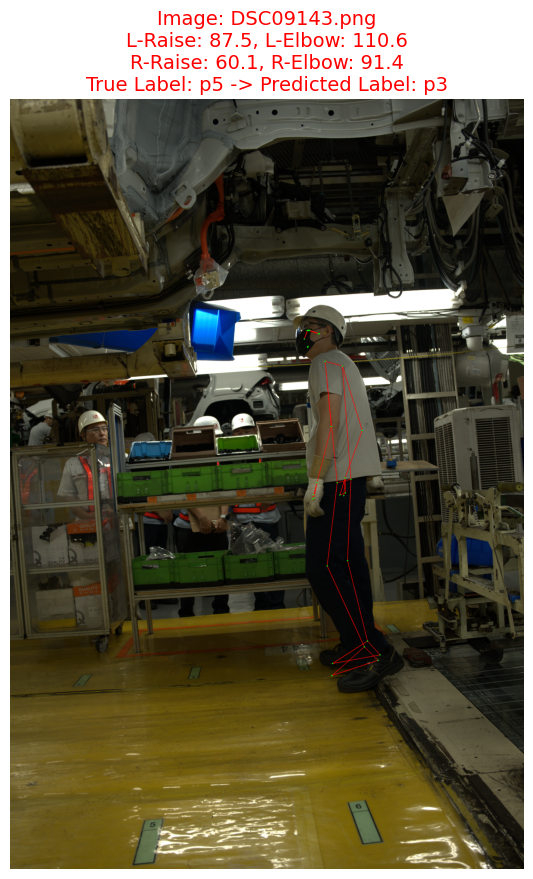

Processing p5:  96%|█████████▌| 75/78 [02:17<00:04,  1.48s/it]

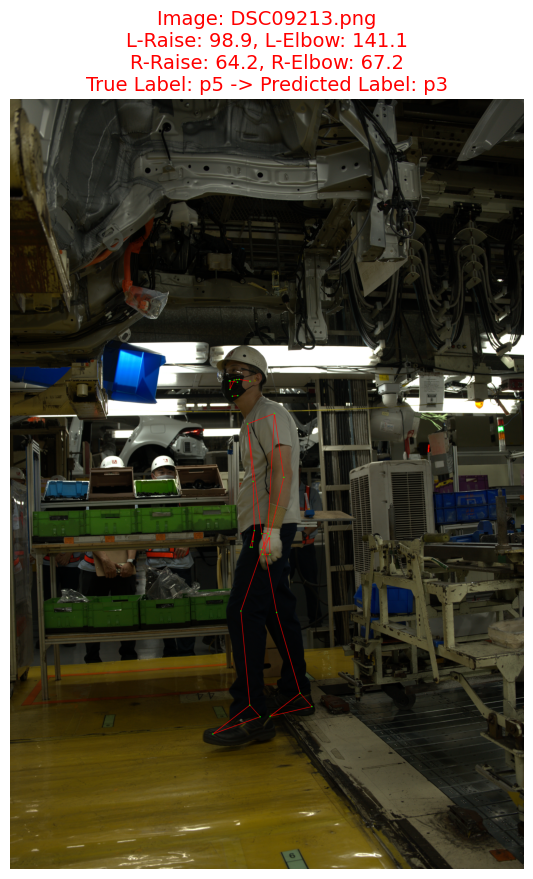

Processing p5: 100%|██████████| 78/78 [02:24<00:00,  1.85s/it]


📋 P5 資料夾中所有圖片的詳細角度與分類結果
Filename                       |    L-Raise |    L-Elbow |    R-Raise |    R-Elbow |   Best Score |    Predicted Label
------------------------------------------------------------------------------------------------------------------------
DSC08369.png                   |       69.6 |      131.1 |       45.9 |      128.3 |            2 |                 p4
DSC08370.png                   |       50.0 |      145.1 |       70.5 |      147.7 |            2 |                 p4
DSC08390.png                   |        8.3 |      109.0 |       49.0 |      144.4 |            1 |                 p5
DSC08396.png                   |       53.6 |       62.1 |       56.4 |       82.6 |            2 |                 p4
DSC08408.png                   |       37.3 |      116.2 |       37.7 |      128.7 |            1 |                 p5
DSC08409.png                   |       61.7 |       68.5 |       48.9 |       62.9 |            2 |                 p4
DSC08417.png         

In [1]:
#!/usr/bin/env python3
"""
Posture classification & evaluation for data_new/ - Focus on P5
- 遍歷 data_new/p5
- MediaPipe Pose 推論，計算 score → label
- 針對 P5 輸出混淆矩陣、precision/recall/F1
- 記錄無法偵測骨架 / 讀檔失敗的圖片
- **更新**: 只可視化被錯誤分類為 p1, p2, p3 的 p5 樣本
- **新增**: 輸出一個包含每張 P5 圖片詳細角度與分數的表格
- **修改**: 強制繪製所有偵測到的關鍵點，無視可信度，以評估模型準確度
"""

import cv2
import mediapipe as mp
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm
import warnings

warnings.filterwarnings("ignore")

# --- MediaPipe 初始化 ---
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_pose = mp.solutions.pose

# ---------- 新增：自訂繪圖函式，強制繪製所有點 ----------
def draw_all_landmarks_and_connections(
    image: np.ndarray,
    landmark_list,
    connections,
    landmark_color=(0, 255, 0),      # 關節點顏色 (亮綠色)
    connection_color=(0, 0, 255),    # 連接線顏色 (亮紅色)
    landmark_radius=6,
    connection_thickness=4
):
    """
    手動繪製所有關鍵點與連接線，無視 visibility 分數。
    """
    if not landmark_list:
        return

    h, w, _ = image.shape
    landmarks = landmark_list.landmark
    drawn_points = {} # 儲存已繪製點的像素座標

    # 1. 繪製所有連接線
    if connections:
        for connection in connections:
            start_idx = connection[0]
            end_idx = connection[1]

            # 將正規化座標轉換為像素座標
            start_px = (int(landmarks[start_idx].x * w), int(landmarks[start_idx].y * h))
            end_px = (int(landmarks[end_idx].x * w), int(landmarks[end_idx].y * h))

            cv2.line(image, start_px, end_px, connection_color, connection_thickness)
            drawn_points[start_idx] = start_px
            drawn_points[end_idx] = end_px
            
    # 2. 繪製所有關鍵點 (確保每個點都被畫到)
    for idx, landmark in enumerate(landmarks):
        # 如果點已經在繪製連接線時處理過，就用已存的座標
        if idx in drawn_points:
            px = drawn_points[idx]
        # 否則重新計算 (例如，有些點沒有任何連接線)
        else:
            px = (int(landmark.x * w), int(landmark.y * h))

        cv2.circle(image, px, landmark_radius, landmark_color, -1) # -1 代表實心圓


# ---------- 分類規則 ----------
def score_to_label(score: int) -> str:
    if score in (10, 7):
        return "p1"
    if score == 5:
        return "p2"
    if score == 4:
        return "p3"
    if score == 2:
        return "p4"
    if score == 1:
        return "p5"
    return "unknown"

# ---------- 姿勢角、得分 ----------
def angle_between(v1, v2):
    """計算兩個向量之間的角度"""
    v1, v2 = np.array(v1), np.array(v2)
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    if norm_v1 == 0 or norm_v2 == 0:
        return 0
    cos_angle = np.clip(dot_product / (norm_v1 * norm_v2), -1.0, 1.0)
    return np.degrees(np.arccos(cos_angle))

def get_posture_score(theta_raise, theta_elbow):
    """根據角度計算分數"""
    if theta_raise >= 170:
        return 10
    if 100 < theta_raise < 170:
        return 7
    if 80 <= theta_raise <= 100:
        return 5 if theta_elbow >= 150 else 4
    if 50 <= theta_raise < 80:
        return 2
    if theta_raise < 50: # 這是 P5 的條件 (score = 1)
        return 1
    return 0  # 未定義

def calculate_arm_angles(lm, side, mp_pose):
    """
    計算指定手臂的舉手角度和手肘角度
    :param lm: MediaPipe 偵測到的 landmark
    :param side: "LEFT" 或 "RIGHT"
    :return: (theta_raise, theta_elbow)
    """
    SH = lm[getattr(mp_pose.PoseLandmark, f"{side}_SHOULDER").value]
    EL = lm[getattr(mp_pose.PoseLandmark, f"{side}_ELBOW").value]
    WR = lm[getattr(mp_pose.PoseLandmark, f"{side}_WRIST").value]
    HIP = lm[getattr(mp_pose.PoseLandmark, f"{side}_HIP").value]

    SH_vec = np.array([SH.x, SH.y, SH.z])
    EL_vec = np.array([EL.x, EL.y, EL.z])
    WR_vec = np.array([WR.x, WR.y, WR.z])
    HIP_vec = np.array([HIP.x, HIP.y, HIP.z])

    shoulder_to_elbow = EL_vec - SH_vec
    shoulder_to_hip = HIP_vec - SH_vec
    elbow_to_wrist = WR_vec - EL_vec
    elbow_to_shoulder = SH_vec - EL_vec

    theta_raise = angle_between(shoulder_to_elbow, shoulder_to_hip)
    theta_elbow = angle_between(elbow_to_wrist, elbow_to_shoulder)

    return theta_raise, theta_elbow

def arm_score(lm, side, mp_pose):
    """計算單邊手臂的分數"""
    theta_raise, theta_elbow = calculate_arm_angles(lm, side, mp_pose)
    return get_posture_score(theta_raise, theta_elbow)


# ---------- 資料夾與設定 ----------
DATA_NEW = Path("../../data_new")
POSE_CLASSES_TO_EVALUATE = ["p5"]
ALL_POSSIBLE_LABELS = ["p1", "p2", "p3", "p4", "p5"]

true_labels, pred_labels = [], []
undetected_images, read_failed_images = [], []
detailed_results = []

# ---------- MediaPipe 模型 ----------
pose = mp_pose.Pose(static_image_mode=True, model_complexity=1)

print(f"--- 開始評估 P4 姿勢 ---")
print(f"--- 將顯示被誤判為 p1, p2, p3 的樣本 ---")

for cls in POSE_CLASSES_TO_EVALUATE:
    image_files = sorted((DATA_NEW / cls).glob("*"))
    for img_path in tqdm(image_files, desc=f"Processing {cls}"):
        img = cv2.imread(str(img_path))
        if img is None:
            read_failed_images.append(img_path.relative_to(DATA_NEW).as_posix())
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = pose.process(img_rgb)

        if not results.pose_landmarks:
            undetected_images.append(img_path.relative_to(DATA_NEW).as_posix())
            continue

        lm = results.pose_landmarks.landmark
        
        # --- 角度與分數計算 (對每張圖都執行) ---
        left_raise, left_elbow = calculate_arm_angles(lm, "LEFT", mp_pose)
        right_raise, right_elbow = calculate_arm_angles(lm, "RIGHT", mp_pose)
        
        left_score = get_posture_score(left_raise, left_elbow)
        right_score = get_posture_score(right_raise, right_elbow)
        best_score = max(left_score, right_score)
        
        pred_label = score_to_label(best_score)
        true_labels.append(cls)
        pred_labels.append(pred_label)

        # --- 新增: 儲存詳細結果到列表中 ---
        detailed_results.append({
            "filename": img_path.name,
            "L-Raise": left_raise,
            "L-Elbow": left_elbow,
            "R-Raise": right_raise,
            "R-Elbow": right_elbow,
            "Score": best_score,
            "Prediction": pred_label
        })

        #---------- 可視化邏輯 ----------
        #只顯示被錯誤分類為 p1, p2, 或 p3 的樣本
        if cls == "p5" and pred_label in ["p1", "p2", "p3"]:
            annotated_image = img.copy()

            # --- 修改：呼叫我們自訂的繪圖函式 ---
            draw_all_landmarks_and_connections(
                image=annotated_image,
                landmark_list=results.pose_landmarks,
                connections=mp_pose.POSE_CONNECTIONS
            )

            # 定義要在圖片和標題中顯示的文字
            info_text_left = f"L-Raise: {left_raise:.1f}, L-Elbow: {left_elbow:.1f}"
            info_text_right = f"R-Raise: {right_raise:.1f}, R-Elbow: {right_elbow:.1f}"
            
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))

            # 建立新的標題，包含圖片名稱、分類結果和詳細的角度資訊
            title_text = (
                f"Image: {img_path.name}\n"
                f"{info_text_left}\n"
                f"{info_text_right}\n"
                f"True Label: {cls} -> Predicted Label: {pred_label}"
            )
            
            plt.title(title_text, color='red', fontsize=14)
            plt.axis('off')
            plt.show()

pose.close()

# ---------- 輸出詳細角度表格 ----------
print("\n" + "="*120)
print("📋 P5 資料夾中所有圖片的詳細角度與分類結果")
print("="*120)
# 表格標頭
header = (
    f"{'Filename':<30} | "
    f"{'L-Raise':>10} | {'L-Elbow':>10} | "
    f"{'R-Raise':>10} | {'R-Elbow':>10} | "
    f"{'Best Score':>12} | {'Predicted Label':>18}"
)
print(header)
print("-" * 120)
# 表格內容
for result in detailed_results:
    row = (
        f"{result['filename']:<30} | "
        f"{result['L-Raise']:>10.1f} | {result['L-Elbow']:>10.1f} | "
        f"{result['R-Raise']:>10.1f} | {result['R-Elbow']:>10.1f} | "
        f"{result['Score']:>12} | {result['Prediction']:>18}"
    )
    print(row)
print("="*120 + "\n")


# ---------- 評估 ----------
print("📊 針對 P5 姿勢的混淆矩陣 (預測順序 p1~p5):")
cm = confusion_matrix(true_labels, pred_labels, labels=ALL_POSSIBLE_LABELS)
print(cm)

print("\n📈 針對 P5 姿勢的分類報告:")
print(classification_report(true_labels, pred_labels,
                              labels=ALL_POSSIBLE_LABELS, digits=3, zero_division=0))

# ---------- 輸出偵測失敗清單 ----------
all_failed = read_failed_images + undetected_images
if all_failed:
    txt_path = Path("undetected_images_p5_only.txt")
    with txt_path.open("w", encoding="utf-8") as f:
        f.write("\n".join(all_failed))
    print(f"\n⚠️  共 {len(all_failed)} 張 P5 圖片未納入評估，清單已寫入 {txt_path}")
    if read_failed_images:
        print(f"  - cv2 讀取失敗：{len(read_failed_images)} 張")
    if undetected_images:
        print(f"  - Pose 未偵測到人體：{len(undetected_images)} 張")
else:
    print("\n✅ 所有 P5 圖片皆成功偵測並納入評估")

print(f"\n--- P5 姿勢評估結束 ---")